# Wine Quality Prediction (DSCI522_group17)

## Exploratory Data Analysis

In [1]:
# uploading libraries
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import seaborn as sns
import altair as alt
import warnings
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')

# Introduction

The data set used in this project is sourced from the UCI Machine Learning Repository. There are two datasets. One is for red wine while the other is for white wine. We will merge these two datasets together and create a new column type of wine to represent the wine type for each observation. In addition, we will group the quality of wine into three categories and they are "Bad", "Good", and "Excellent". In total, we have 12 predictors and one output variable.

In [2]:
#Uploading dataset for redwine
data_red= pd.read_csv("winequality-red.csv", ";")

In [3]:
#cleaning data
data_red = data_red.rename(columns=lambda x: x.replace(" ","_"))

#creating levels for 'quality_level' column
data_red['quality_level'] = [True if x >= 6 else False for x in data_red['quality']]
data_red['wine_type']= "red"
#data_red.head()

In [4]:
#load data
data_red.sample(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,quality_level,wine_type
1318,7.5,0.63,0.27,2.0,0.083,17.0,91.0,0.99616,3.26,0.58,9.8,6,True,red
1390,6.0,0.49,0.00,2.3,0.068,15.0,33.0,0.99292,3.58,0.59,12.5,6,True,red
66,7.5,0.52,0.11,1.5,0.079,11.0,39.0,0.99680,3.42,0.58,9.6,5,False,red


In [5]:
#uploading white wine data set
data_white= pd.read_csv("winequality-white.csv", ";")

In [6]:
#cleaning data
data_white = data_white.rename(columns=lambda x: x.replace(" ","_"))

#creating levels for 'quality_level' column
data_white['quality_level'] = [True if x >= 6 else False for x in data_white['quality']]
data_white['wine_type']= "white"

In [7]:
#dimension red wine data set
data_red.shape

(1599, 14)

In [8]:
#dimension white wine data set
data_white.shape

(4898, 14)

In [9]:
#merging red wine and white wine data set
full_data = pd.concat([data_white, data_red], axis=0)
full_data = full_data.drop('quality', axis = 1)

In [10]:
#dimension of merged data set
full_data.shape

(6497, 13)

In [11]:
#first 4 lines of data set
full_data.head(5)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality_level,wine_type
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,True,white
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,True,white
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,True,white
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,True,white
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,True,white


# Spliting the data set into training and test sets

**Before starting our analysis, we will split the data into train data set (75%) and into training (25%) data set. Below is the distribution  of each class in the training set.**

In [12]:
#split
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(full_data, test_size=0.25, random_state=123)
#dist_class = alt.Chart(train_df, title = 'Distribution of Quality Level').mark_bar().encode(x = alt.X('quality_level', title = 'Quality Level'),
                                   #   y = 'count()').properties(width=200, height = 200)
#dist_class.save('figures/dist_class.html')
#dist_class

In [13]:
train_df["quality_level"].value_counts()

True     3050
False    1822
Name: quality_level, dtype: int64

# Exploratory data analysis (EDA) by using pandas profile Python module and Seaborn Python library

Here, we will use Pandas Profiling to do a basic analysis on each of the variable.

In [14]:
profile = ProfileReport(train_df)

In [15]:
profile

In [16]:
profile.to_file(output_file="figures/Pandas_profiling.html")

### Boxplot to Analyze Distributions as well as Outliers for Each Continous Predictors(double click to enlarge)

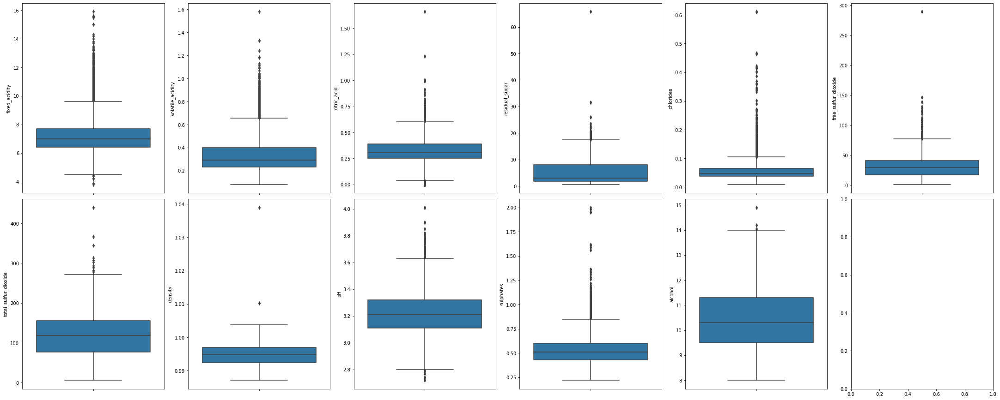

In [17]:
fig, ax = plt.subplots(ncols=6, nrows=2, figsize=(30,12))
index=0
ax= ax.flatten()
for col, value in train_df.drop(['quality_level', 'wine_type'], axis = 1).items():
    sns.boxplot(y=col, data=full_data , ax=ax[index])
    index +=1
plt.tight_layout(pad=0.5, w_pad=0.7)

### Density plot to Analyze Data Distribution

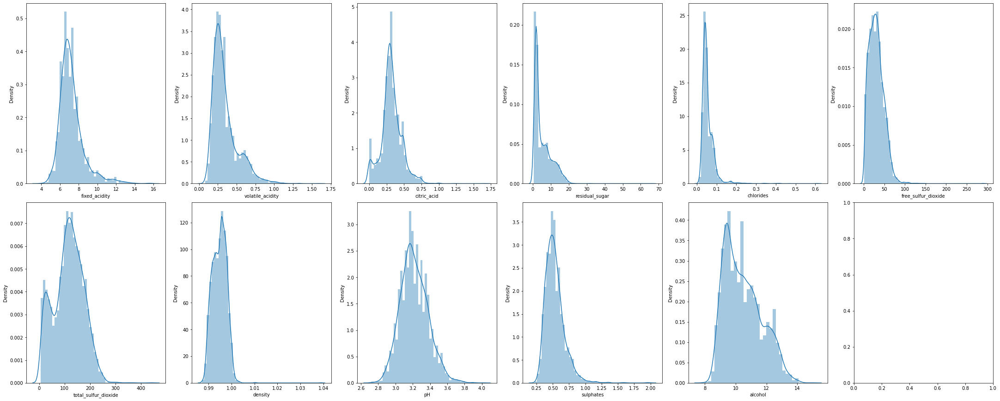

In [18]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(ncols=6, nrows=2, figsize=(30,12))
index=0
ax= ax.flatten()

for col, value in train_df.drop(['quality_level', 'wine_type'], axis = 1).items():
    sns.distplot(value, ax=ax[index])
    index +=1

#plt.savefig('figures/Distribution.png')
plt.tight_layout(pad=0.5, w_pad=0.7)


### Seaborn Pairplot to Analyze the Interaction Between Variables Among Each Class (double click to enlarge the file)

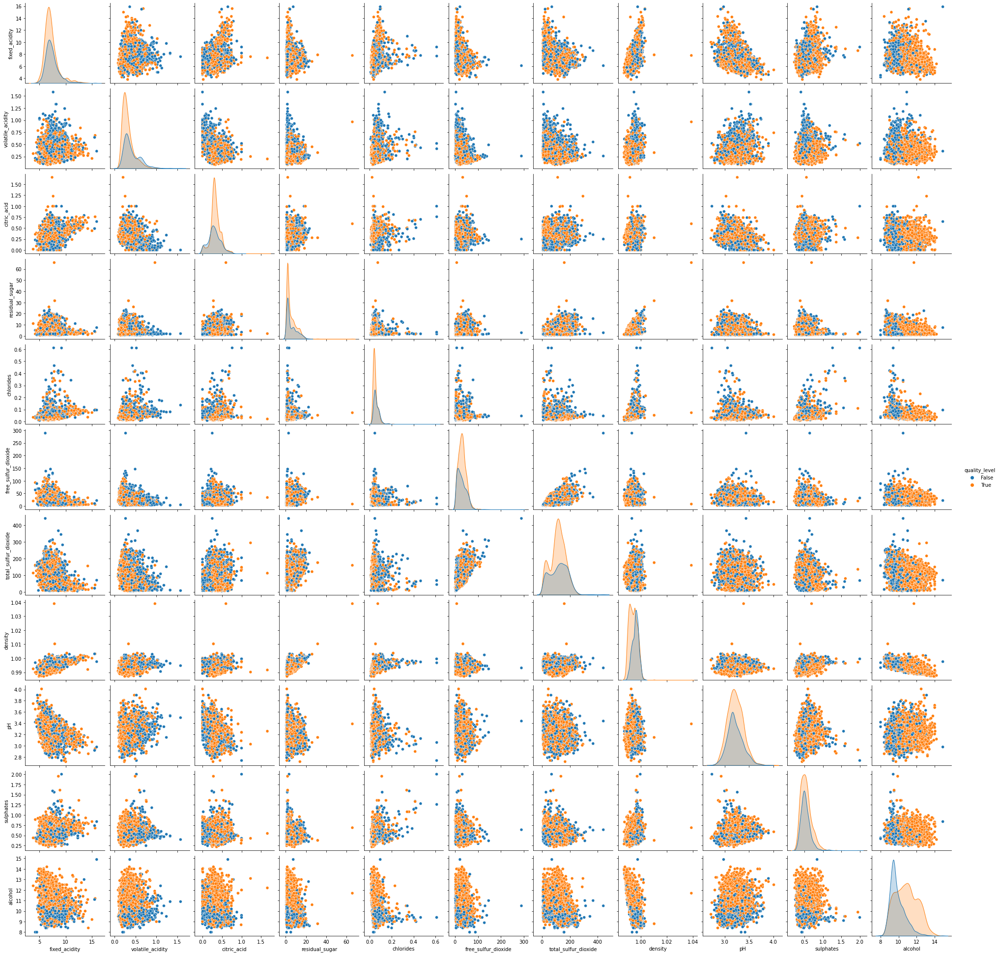

In [19]:
wine_pairplot = sns.pairplot(train_df.drop('wine_type', axis = 1), hue="quality_level")
wine_pairplot.savefig("figures/wine_pairplot.png")
wine_pairplot

# Observations

- There are no missing values in the training data set.
- Some of the variables such as fixed_acidity, volatile_acidity etc. are very right skewed and may need a treatment. We may need to scale the data when building our model.
- Most of the continous variables contain outliers. However, some variables(citric acid, residual_sugar, free_sulfur_dioxide, density etc ) contain bigger outliers. Hence, we may need to treat them before building our models.

# Separate X and y from train_df and test_df

In [20]:
X_train, y_train = train_df.drop(columns=["quality_level"]), train_df["quality_level"]
X_test, y_test = test_df.drop(columns=["quality_level"]), test_df["quality_level"]

# Identify different feature types

In [21]:
numeric_features = ["fixed_acidity", "volatile_acidity", "citric_acid", "residual_sugar", "chlorides", "free_sulfur_dioxide", "total_sulfur_dioxide", "density", "pH", "sulphates", "alcohol"]

binary_features = ['wine_type']

target = ['quality_level']

In [22]:
#just for Pan
X_train.shape

(4872, 12)

In [23]:
#just for Pan
y_train.head()

3372     True
1094    False
1514     True
853     False
3784     True
Name: quality_level, dtype: bool

In [24]:
X_test.shape

(1625, 12)

In [25]:
train_df.shape

(4872, 13)

In [26]:
test_df.shape

(1625, 13)

# Feature transformations

In [27]:
from sklearn.compose import (ColumnTransformer, TransformedTargetRegressor, make_column_transformer)

from sklearn.pipeline import Pipeline, make_pipeline


from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LogisticRegression, Ridge
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
    make_scorer,
    precision_score,
    recall_score,
)


from sklearn.model_selection import (
    GridSearchCV,
    RandomizedSearchCV,
    cross_validate,
    train_test_split,
)


from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler
from sklearn.svm import SVC, SVR

import scipy 
from scipy.stats import randint

In [28]:
# numeric_features: scaling
# binary_features: one-hot encoding with (if_binary=True)


from sklearn.compose import ColumnTransformer, make_column_transformer

#numeric_transformer = make_pipeline(SimpleImputer(strategy="median"), StandardScaler())



#binary_transformer = make_pipeline(
    #SimpleImputer(strategy="constant", fill_value="missing"),
   # OneHotEncoder(drop="if_binary", dtype=int),
#)


preprocessor = make_column_transformer(
    (StandardScaler(), numeric_features),
    (OneHotEncoder(handle_unknown="error", drop="if_binary"), binary_features),
)

# Exploring different scoring methods on different classifiers

In [29]:
classifiers = {
    "Logistic Regression": LogisticRegression(),
    "Logistic Regression (balanced)": LogisticRegression(class_weight="balanced"),
    "Random Forest": RandomForestClassifier(),
    "Random Forest (balanced)": RandomForestClassifier(class_weight="balanced"),
}


# Model by using classifier

In [30]:
def score_with_metrics(models, preprocessor, scoring="f1"):
    """
    Return cross-validation scores for given models as a dataframe.

    Parameters
    ----------
    models : dict
        a dictionary with names and scikit-learn models
    scoring : list/dict/string
        scoring parameter values for cross-validation

    Returns
    ----------
        None

    """
    results_df = {}
    for (name, model) in models.items():
        pipeline = make_pipeline(preprocessor, model)
        scores = cross_validate(
            pipeline, X_train, y_train, return_train_score=True, scoring=scoring
        )
        df = pd.DataFrame(scores)
        results_df[name] = df.mean()
    return pd.DataFrame(results_df)

In [31]:

score_with_metrics(
    classifiers,
    preprocessor, 
    scoring=["accuracy", "f1", "recall", "precision", "average_precision", "roc_auc"],
)

,Logistic Regression,Logistic Regression (balanced),Random Forest,Random Forest (balanced)
fit_time,0.045192,0.052303,1.047260,1.049996
score_time,0.032295,0.037500,0.133568,0.100764
test_accuracy,0.736046,0.729476,0.818553,0.815886
train_accuracy,0.739070,0.729936,0.999949,1.000000
test_f1,0.797373,0.767306,0.857677,0.856945
train_f1,0.799509,0.767921,0.999959,1.000000
test_recall,0.829508,0.713115,0.873443,0.880984
train_recall,0.831066,0.713770,1.000000,1.000000
test_precision,0.767767,0.830858,0.842505,0.834267
train_precision,0.770282,0.830993,0.999918,1.000000


# Observations

The standard Random Forest has a higher test score